<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Data-loading-and-cleaning" data-toc-modified-id="Data-loading-and-cleaning-1">Data loading and cleaning</a></span></li><li><span><a href="#Exploratory" data-toc-modified-id="Exploratory-2">Exploratory</a></span><ul class="toc-item"><li><span><a href="#deaths-distributions" data-toc-modified-id="deaths-distributions-2.1">deaths distributions</a></span><ul class="toc-item"><li><span><a href="#deaths-distribution-by-day" data-toc-modified-id="deaths-distribution-by-day-2.1.1">deaths distribution by day</a></span></li><li><span><a href="#deaths-distribution-by-parish" data-toc-modified-id="deaths-distribution-by-parish-2.1.2">deaths distribution by parish</a></span></li></ul></li><li><span><a href="#static--time-series" data-toc-modified-id="static--time-series-2.2">static  time-series</a></span></li><li><span><a href="#interactive-time-series" data-toc-modified-id="interactive-time-series-2.3">interactive time-series</a></span></li></ul></li><li><span><a href="#Peaks-correlation" data-toc-modified-id="Peaks-correlation-3">Peaks correlation</a></span><ul class="toc-item"><li><span><a href="#peaks-detection" data-toc-modified-id="peaks-detection-3.1">peaks detection</a></span></li><li><span><a href="#stats-on-peaks-timing" data-toc-modified-id="stats-on-peaks-timing-3.2">stats on peaks timing</a></span></li></ul></li><li><span><a href="#Clustering" data-toc-modified-id="Clustering-4">Clustering</a></span><ul class="toc-item"><li><span><a href="#whole-dataset" data-toc-modified-id="whole-dataset-4.1">whole dataset</a></span><ul class="toc-item"><li><span><a href="#computation-and-plots" data-toc-modified-id="computation-and-plots-4.1.1">computation and plots</a></span></li><li><span><a href="#interpretation" data-toc-modified-id="interpretation-4.1.2">interpretation</a></span></li></ul></li><li><span><a href="#all-parishes,-1st-peak-only" data-toc-modified-id="all-parishes,-1st-peak-only-4.2">all parishes, 1st peak only</a></span></li><li><span><a href="#all-parishes-and-tail" data-toc-modified-id="all-parishes-and-tail-4.3">all parishes and tail</a></span><ul class="toc-item"><li><span><a href="#computation" data-toc-modified-id="computation-4.3.1">computation</a></span></li><li><span><a href="#comments" data-toc-modified-id="comments-4.3.2">comments</a></span></li></ul></li></ul></li><li><span><a href="#Distance-correlation" data-toc-modified-id="Distance-correlation-5">Distance correlation</a></span><ul class="toc-item"><li><span><a href="#computation" data-toc-modified-id="computation-5.1">computation</a></span></li><li><span><a href="#interactive-plot" data-toc-modified-id="interactive-plot-5.2">interactive plot</a></span></li><li><span><a href="#static-plot" data-toc-modified-id="static-plot-5.3">static plot</a></span></li></ul></li><li><span><a href="#Extra:-Time-map" data-toc-modified-id="Extra:-Time-map-6">Extra: Time map</a></span><ul class="toc-item"><li><span><a href="#basic-map" data-toc-modified-id="basic-map-6.1">basic map</a></span></li><li><span><a href="#merge-parish-names" data-toc-modified-id="merge-parish-names-6.2">merge parish names</a></span></li><li><span><a href="#compute-parish-centroids" data-toc-modified-id="compute-parish-centroids-6.3">compute parish centroids</a></span></li><li><span><a href="#parish-markers-layer" data-toc-modified-id="parish-markers-layer-6.4">parish markers layer</a></span></li><li><span><a href="#polygons-layer" data-toc-modified-id="polygons-layer-6.5">polygons layer</a></span></li><li><span><a href="#add-cases-data" data-toc-modified-id="add-cases-data-6.6">add cases data</a></span></li></ul></li><li><span><a href="#Extra:-cross/auto-correlations" data-toc-modified-id="Extra:-cross/auto-correlations-7">Extra: cross/auto correlations</a></span><ul class="toc-item"><li><span><a href="#CCF" data-toc-modified-id="CCF-7.1">CCF</a></span><ul class="toc-item"><li><span><a href="#parish-with-outlier-ccf-peaks" data-toc-modified-id="parish-with-outlier-ccf-peaks-7.1.1">parish with outlier ccf peaks</a></span></li></ul></li><li><span><a href="#ACF" data-toc-modified-id="ACF-7.2">ACF</a></span><ul class="toc-item"><li><span><a href="#check-for-randomness" data-toc-modified-id="check-for-randomness-7.2.1">check for randomness</a></span></li></ul></li><li><span><a href="#lag-plots" data-toc-modified-id="lag-plots-7.3">lag plots</a></span></li></ul></li></ul></div>

In [3]:
import pandas as pd
import numpy as np

# modules for plotting
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_context('notebook')
%config InlineBackend.figure_format = 'retina'

# modules for stats
# from scipy import stats

# handle date time
import datetime

# module to save space
import gc

In [4]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

# Data loading and cleaning  

load dataset – __daily deaths records__

In [6]:
full_df = pd.read_csv('./dataset/ALL_utf.csv')
full_df.shape

(1095, 71)

fix date

In [7]:
# need to replace wrong string
full_df.Date = full_df.Date.apply(lambda x: x.replace('2029', '1629'))
full_df.Date = full_df.Date.apply(lambda x: x.replace('2030', '1630'))
full_df.Date = full_df.Date.apply(lambda x: x.replace('2031', '1631'))

# set date as index
full_df.index = full_df.Date.apply(lambda x: datetime.datetime.strptime(x, '%m/%d/%Y').date())

# drop date column
full_df.drop('Date',axis=1,inplace=True)

# drop index name -- to simplify the plots
full_df.index.name = None

print(full_df.shape)
full_df.head()

(1095, 70)


,S. Agnese,S. Agostin,S. Angelo,Angelo Rafael,S. Antonino,S. Aponal,S. Barnaba,S. Basilio,S. Basso,S. Beneto,...,S. Stae,S. Stin,S. Ternita,S. Tomà,S. Trovaso,S. Vidal,S. Vio,S. Ziminian,S. Zulian,S. Apostoli
1629-01-01,NaN,0,1,0,NaN,0,0,0.0,0,NaN,...,NaN,0,NaN,NaN,1,0,NaN,1,0,0
1629-01-02,NaN,0,0,0,NaN,0,0,0.0,0,NaN,...,NaN,1,NaN,NaN,1,0,NaN,0,0,0
1629-01-03,NaN,0,0,1,NaN,0,0,0.0,0,NaN,...,NaN,0,NaN,NaN,1,0,NaN,0,0,0
1629-01-04,NaN,0,0,0,NaN,0,0,0.0,0,NaN,...,NaN,0,NaN,NaN,0,0,NaN,0,0,0
1629-01-05,NaN,0,0,0,NaN,0,0,0.0,0,NaN,...,NaN,0,NaN,NaN,0,0,NaN,0,1,0


distribution of N of non null values

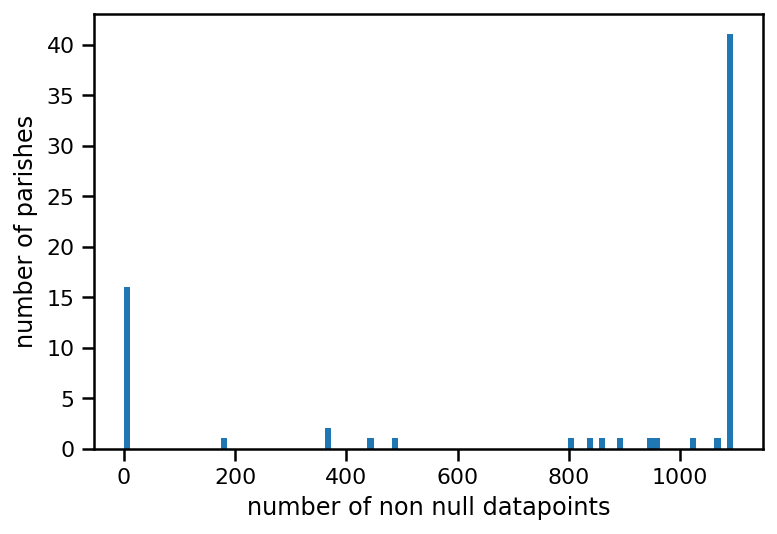

In [5]:
full_df.notnull().sum().plot.hist(bins=100)

plt.xlabel('number of non null datapoints')
plt.ylabel('number of parishes');

replace all nans with 0 

In [8]:
# fill nan
full_df.fillna(0,inplace=True)

# double check
full_df.isnull().sum().sum()

0

remove parishes with no cases

In [9]:
print('shape before:',full_df.shape)

sum_by_par = full_df.sum(axis=0)

# remove the ones with no cases 
full_df = full_df[sum_by_par[sum_by_par > 0].keys()]

# double check its shape
print('shape after:',full_df.shape)

shape before: (1095, 70)
shape after: (1095, 54)


In [8]:
# save df
full_df.to_csv('dataset/filledna_full_ts.csv')

# Exploratory

## deaths distributions

### deaths distribution by day

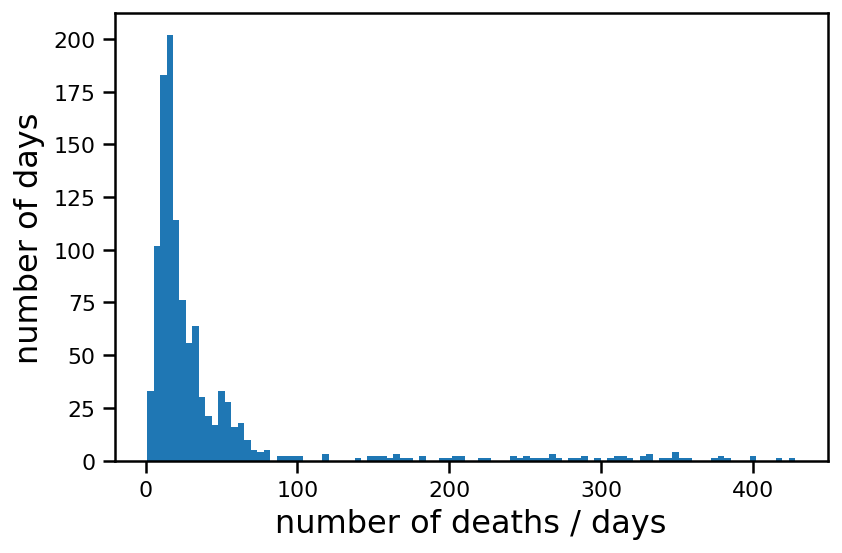

In [12]:
full_df.sum(axis=1).hist(bins=100)

plt.grid(False)
# plt.yscale('log')
# plt.xscale('log')

plt.ylabel('number of days', size=16)
plt.xlabel('number of deaths / days', size=16)
plt.tight_layout()
# plt.savefig('./explorative_plots/dist_by_day.pdf');

most deadly days:

In [17]:
thr_by_day = 300

sum_by_day = full_df.sum(axis=1).sort_values(ascending=False)

print(sum(sum_by_day > thr_by_day))
# sum_by_day[sum_by_day > thr_by_day]

27


counts in different periods

In [18]:
valley_date = datetime.date(1631, 2, 1)

end_1630 = datetime.date(1630, 12, 31)

In [19]:
print('deaths in 1631:', full_df[full_df.index > end_1630].sum().sum())

print('deaths in tail:', full_df[full_df.index >= valley_date].sum().sum())

print('deaths before tail:', full_df[full_df.index < valley_date].sum().sum())

print('total deaths:', full_df.sum().sum())

deaths in 1631: 11507.0
deaths in tail: 10363.0
deaths before tail: 32725.0
total deaths: 43088.0


deaths counts for the paper

In [20]:
full_df[(full_df.index >= datetime.date(1630,9,1)) & (full_df.index <= end_1630)].sum().sum()

20923.0

In [21]:
full_df[(full_df.index >= datetime.date(1631,1,1)) & (full_df.index <= datetime.date(1631,8,31))].sum().sum()

10430.0

### deaths distribution by parish 

 there are some 'outlier' parishes

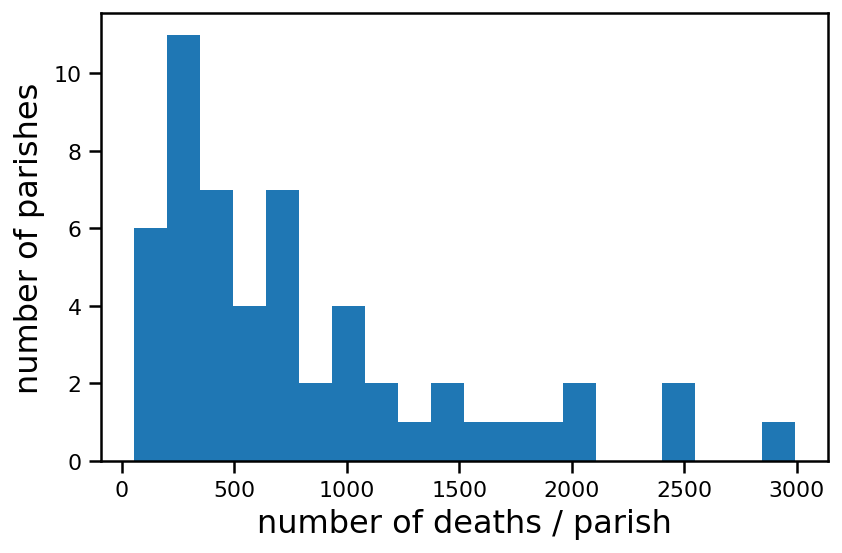

In [24]:
full_df.sum(axis=0).hist(bins=20)

plt.grid(False)
# plt.yscale('log')
# plt.xscale('log')

plt.ylabel('number of parishes', size=16)
plt.xlabel('number of deaths / parish', size=16)
plt.tight_layout()
# plt.savefig('./explorative_plots/dist_by_parish.pdf');

'outliers' parishes - with > 2000 deaths (as fraction, and absolute counts)

In [30]:
threshold = 2000

In [31]:
sum_by_par[sum_by_par.values > threshold].sort_values(ascending=False)/sum_by_par.sum()

S. Pietro di Castello    0.069393
S. Marcuola              0.057812
S. Geremia               0.055816
S. Nicola                0.048668
S. Eufemia               0.048482
dtype: float64

In [32]:
sum_by_par[sum_by_par.values > threshold].sort_values()

S. Eufemia               2089.0
S. Nicola                2097.0
S. Geremia               2405.0
S. Marcuola              2491.0
S. Pietro di Castello    2990.0
dtype: float64

In [33]:
print('% of parishes above some threshold:',
      np.round(sum(sum_by_par.values > threshold) / full_df.shape[1] * 100,2))

print('% of deaths accounted in parish above threshold:',
      np.round(sum_by_par[sum_by_par.values > threshold].sum() / full_df.sum().sum() * 100,2))

% of parishes above some threshold: 9.26
% of deaths accounted in parish above threshold: 28.02


In [34]:
sum_by_par[sum_by_par < 200].sort_values()

S. Agnese                  0.0
S. Simon Piccolo           0.0
S. Salvador                0.0
S. Provolo                 0.0
S. Martino                 0.0
S. Maria Mater Domini      0.0
S. Ternita                 0.0
S. Gregorio                0.0
S. Lucia                   0.0
S. Giovanni Decollato      0.0
S. Fantin                  0.0
S. Cassiano                0.0
S. Boldo                   0.0
S. Beneto                  0.0
S. Giustina                0.0
S. Vio                     0.0
S. Polo                   52.0
S. Stae                  109.0
S. Agostin               147.0
S. Basso                 155.0
S. Maurizio              171.0
S. Marcilian             186.0
dtype: float64

## static  time-series

plot daily deaths, _by parish_

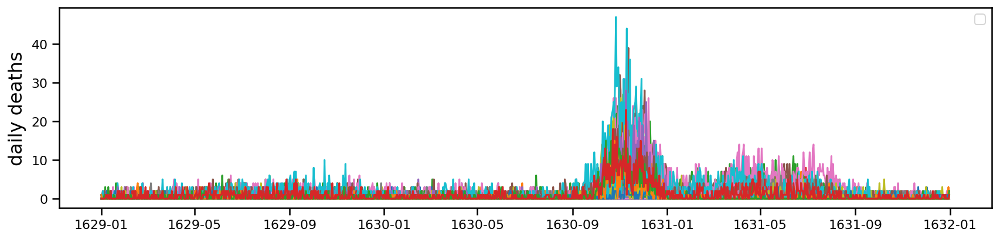

In [7]:
my_plot = full_df.plot(figsize=(12,3))
my_plot.grid(False)

plt.ylabel('daily deaths',size=16)
plt.xlabel('')

plt.legend('')
plt.tight_layout()

# plt.savefig('explorative_plots/full_ts_by_parish.pdf')
# plt.close();

plot total daily deaths

In [10]:
full_df.sum(axis=1).plot(figsize=(15,6))
plt.ylabel('daily deaths',size=24)
plt.xlabel('')

# plt.xticks(rotation=20)
plt.xticks(fontsize=22);
plt.yticks(fontsize=22);

plt.tight_layout()

plt.savefig('explorative_plots/full_ts_summed_parishes.pdf')
plt.close(); # keep plot outside notebook, to save some memory 

heatmap of raw cases

In [38]:
# select dates for x ticks 
my_ticks = np.arange(1,full_df.shape[0],200)
my_labels = [full_df.index[i] for i in my_ticks]

plt.figure(figsize=(12,12))

sns.set(font_scale=1.5)
sns.heatmap(full_df.transpose(),cbar_kws={'label': 'N cases'}) # cmap='RdYlGn',
plt.xticks(ticks=my_ticks, labels=my_labels, rotation=0) # , fontsize=14
plt.xlabel('');

plt.tight_layout();

plt.savefig('./explorative_plots/full_df_heatmap.pdf',bbox_inches='tight')
plt.close(); # keep plot outside notebook, to save some memory 

## interactive time-series

interactive plot

In [11]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

In [12]:
full_trace = []

for my_parish in full_df.columns:

    full_trace.append(
        go.Scatter(
            x=full_df.index,
            y=full_df.loc[:, my_parish],
            name=my_parish,
            mode='lines',
        ))

In [15]:
# setting layout
my_layout = go.Layout(
    title='Daily reports in Venice -- by parish',
    legend=dict(
        x=1,
        y=0,
        font=dict(size=8,
                  #             color=full_df.columns
                  )),
    yaxis=dict(title='daility fatalities', titlefont=dict(size=18))

)

In [16]:
fig = go.Figure(data=full_trace, layout=my_layout)
py.plot(fig,filename='./explorative_plots/all_by_parish.html')

'./explorative_plots/all_by_parish.html'

# Peaks correlation 

this analysis was performed to answer to one of Reviewer 1 's question

In [17]:
from scipy.signal import find_peaks_cwt

In [18]:
# subset useful dataset
df_for_peaks = full_df.iloc[600:1000]

print(df_for_peaks.index.min(),df_for_peaks.index.max())

1630-08-24 1631-09-27


## peaks detection

In [19]:
%%time

peaks = {
    parish: find_peaks_cwt(df_for_peaks[parish],
                           np.repeat(40, df_for_peaks.shape[0]))
    for parish in df_for_peaks.columns
}

CPU times: user 3.72 s, sys: 9.36 ms, total: 3.73 s
Wall time: 3.73 s


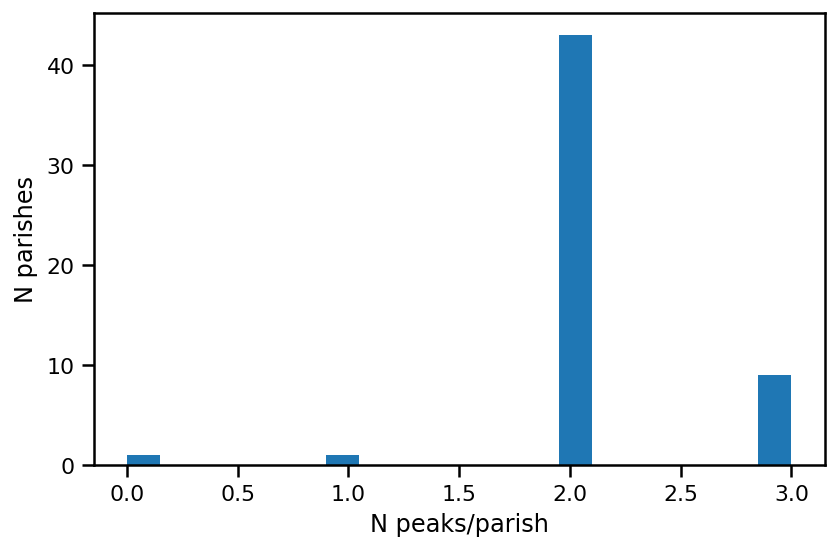

In [22]:
plt.hist([len(p) for p in peaks.values()],bins=20)

# plt.title('Distribution of N of peaks found')
plt.xlabel('N peaks/parish')
plt.ylabel('N parishes')

plt.tight_layout()
# plt.savefig('explorative_plots/distribution_N_peaks.pdf')
plt.show()

In [23]:
# show parishes with less than 2 peaks >> not good data
{par for par in peaks if len(peaks[par]) < 2}

{'S. Marcilian', 'S. Polo'}

In [24]:
def good_return(x):

    if len(x) > 2:
        return x[2]
    else:
        return None

In [25]:
# save peaks separately  for correlation

peaks_df = [
    {'name': par,
     'first_peak': peaks[par][0],
     'second_peak': peaks[par][1],
     'third_peak': good_return(peaks[par])
    }
    for par in peaks if len(peaks[par]) > 1
]

peaks_df = pd.DataFrame(peaks_df)

few main examples of found peaks date

In [26]:
peaks_df[peaks_df.third_peak.notnull()]

,name,first_peak,second_peak,third_peak
12,S. Eufemia,86,242,304.0
18,S. Giovanni Crisostomo,75,250,302.0
19,S. Giovanni Battista in Bragora,71,252,361.0
24,S. Marco,77,229,382.0
26,S. Margherita,89,244,297.0
31,S. Marina,82,251,361.0
37,S. Paternian,79,238,338.0
38,S. Pietro di Castello,71,231,332.0
40,S. Severo,81,252,326.0


In [27]:
df_for_peaks.index[peaks['S. Nicola']]

Index([1630-11-25, 1631-04-23], dtype='object')

In [28]:
df_for_peaks.index[peaks['S. Geremia']]

Index([1630-11-16, 1631-05-04], dtype='object')

## stats on peaks timing

_median_ peaks date, by order (1st, 2nd, ...)

In [29]:
print(peaks_df.median())
df_for_peaks.index[peaks_df.median().values.astype(int)]

first_peak      81.0
second_peak    291.5
third_peak     332.0
dtype: float64


Index([1630-11-13, 1631-06-11, 1631-07-22], dtype='object')

correlation among peaks date

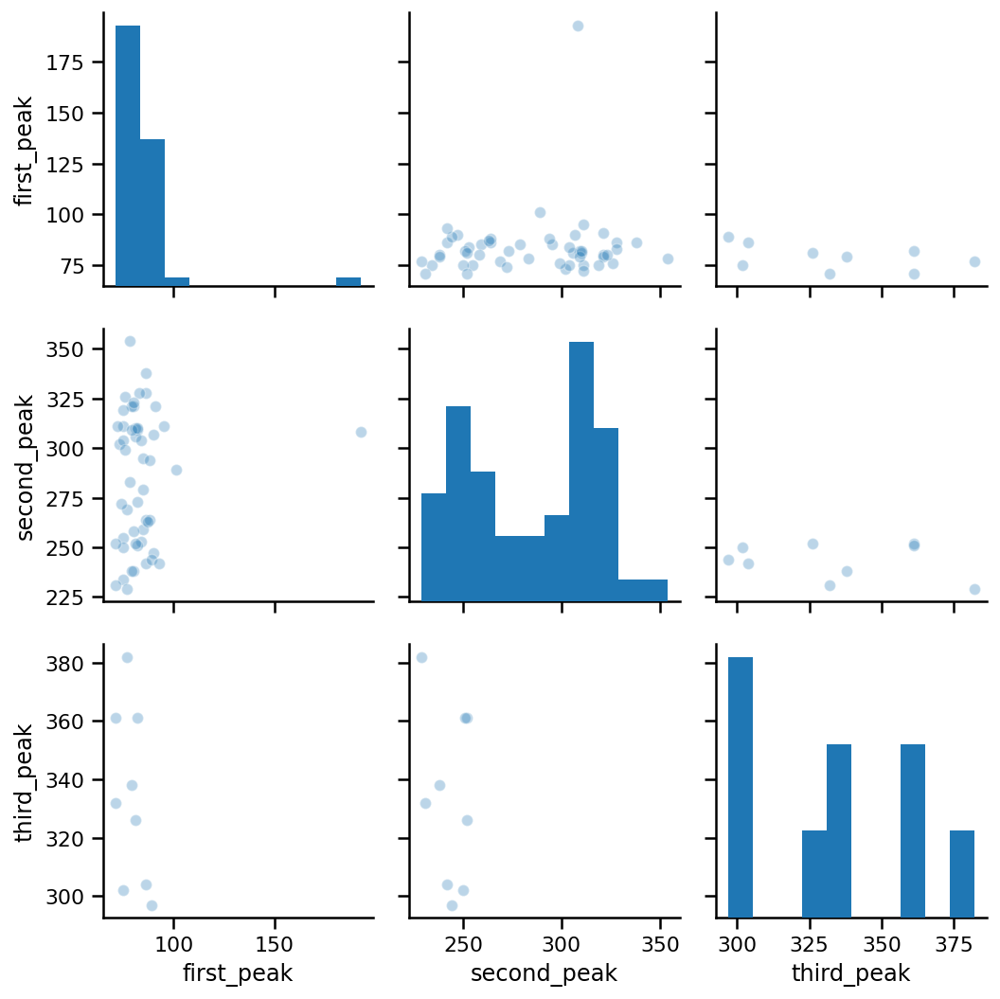

In [30]:
sns.pairplot(peaks_df, plot_kws={'alpha': 0.3})
plt.tight_layout()
# plt.savefig('explorative_plots/peaks_time_corr.pdf')

In [31]:
peaks_df.corr()

,first_peak,second_peak,third_peak
first_peak,1.000000,0.104091,-0.459147
second_peak,0.104091,1.000000,-0.238945
third_peak,-0.459147,-0.238945,1.000000


# Clustering

inspired by:

- [this tutorial](https://towardsdatascience.com/playing-with-time-series-data-in-python-959e2485bff8)
-  [this SO post](https://stackoverflow.com/questions/34940808/hierarchical-clustering-of-time-series-in-python-scipy-numpy-pandas)

In [124]:
from scipy.cluster.hierarchy import dendrogram,linkage

relevant docs for this section: 

[linkage doc](https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html#scipy.cluster.hierarchy.linkage)

[dendogram doc](https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.dendrogram.html#scipy.cluster.hierarchy.dendrogram)

## whole dataset

### computation and plots

please, find here the [list of possible metrics](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.pdist.html)


good metrics, given that we are interested in the 'shape' of the epidemics curves, are :

- `correlation`
- `cosine` -- [tutorial: euclidean-v-cosine](https://cmry.github.io/notes/euclidean-v-cosine)

In [114]:
my_metric = 'correlation'
# my_metric = 'cosine'
# my_metric = 'euclidean'

# my_method = 'single' # this is the default method
# my_method = 'average' 
my_method = 'complete' 

In [117]:
clus_matrix = linkage(y=full_df.transpose(),
                      method=my_method,
                      metric=my_metric,
                      optimal_ordering=True)

#### scipy `dendrogram` 

In [120]:
plt.figure(figsize=(10, 10),frameon=False)

dendrogram(clus_matrix,
##            tree truncation parameters
#            truncate_mode='level',p=1,show_contracted=True,
##            sorting makes clusters more clear -- we checked that it gives the same result
           distance_sort=True,
           leaf_font_size=12,
           labels=full_df.columns,
           orientation='left')

plt.tight_layout();


plt.savefig('clustering_plots/whole_df/dendrogram_method_{}_metric_{}.pdf'.\
            format(my_method,my_metric))

plt.close();

__Comments on hyper-parameters__


-  (distance) _metric_ : 

    of course, as expected, as one can see in the `clustermap` plots, `euclidean`-based  cluster on absolute 
    magnitude, while `correlation`-based on shape. 
    There are also other metric that focus on shape, such as `cosine` ...
    ---> for the time being we stick with `correlation`



- _method_ used to form clusters: 

    – the `average` method seems to give more meaningful results than `simple` one (where the result looks more like one single large cluster)    -- mind that `sns.clustermap` uses indeed  `method='average'` as default    
        
    – interesting results also from the `complete` method -- in particular, 4 main clusters seem to emerge -- see above plot -- for the time being, we'll stick with `complete` as the clusters seem more 'distant' from each other...but their components (parish) are basically the same

#### seaborn `clustermap` 

*  (this is just a wrapper for a better viz ; the actual clusters are still computed with the same `scipy.cluster.hierarchy.linkage`)

* mind that plots are not shown here as they are a bit heavy ...

In [125]:
# my_ax = plt.gca()
# my_ax.xaxis.set_tick_params(labelrotation=0)

sns.clustermap(full_df.transpose(),
               col_cluster=False,
               method=my_method,
               metric=my_metric,
               figsize=(15, 15))

plt.tight_layout()
plt.savefig('clustering_plots/whole_df/clustermap_method_{}_metric_{}.pdf'.format(
    my_method, my_metric))

plt.close()

### interpretation

*  each cluster's 'name' is given according to the parish with the largest cases in the cluster, or other meaningful names
 
* for a closer look to the cluster, don't forget to use also the nice interactive viz ;) : http://localhost:8888/view/explorative_plots/all_by_parish.html -- 

#### outliers parishes 

parishes from small clusters 'distant' from all other clusters

In [127]:
outlier_1 = [
'S. Marco',
'S. Polo',
'S. Marcilian',
'S. Stae']

here we show the difference w.r.t. the total 

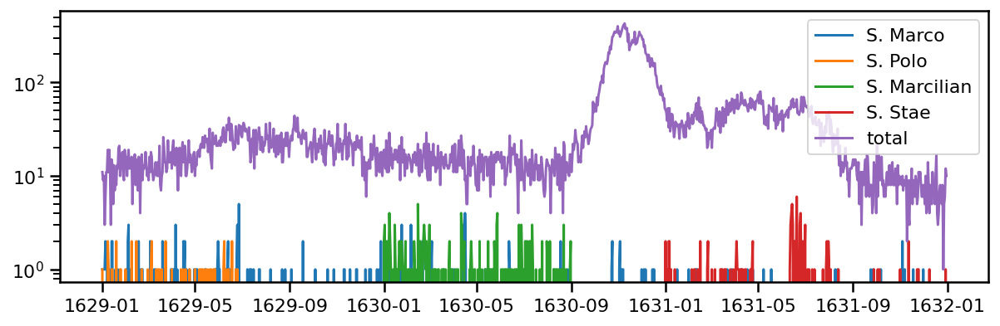

In [136]:
full_df[outlier_1].plot(figsize=(10, 3))

full_df.sum(axis=1).plot(label='total')
# we set yscale to log as the total has much more cases
plt.yscale('log')

plt.legend();

other distant small cluster

In [130]:
outlier_2 = [
'S. Maurizio',
'S. Basso',    
'S. Felice']

here we show the difference w.r.t. the total ...

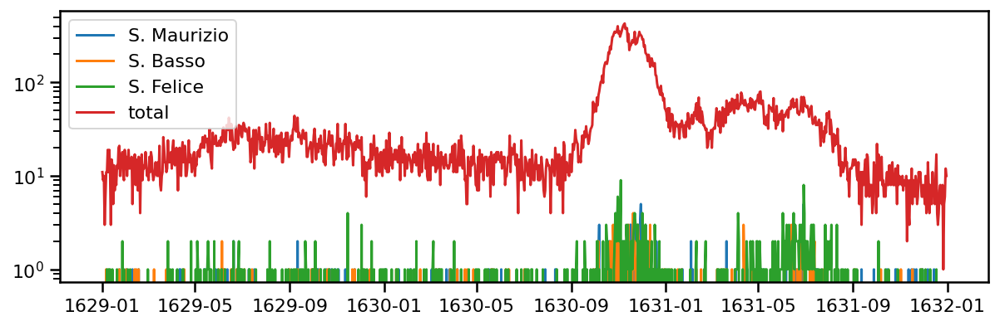

In [135]:
full_df[outlier_2].plot(figsize=(10, 3))

full_df.sum(axis=1).plot(label='total')
# we set yscale to log as the total has much more cases
plt.yscale('log')

plt.legend();

#### closest (geremia) cluster

the _closest_ parishes seems to be the ones in this cluster

In [137]:
closest_cluster = [
    'S. Geremia', 'S. Moisé', 'S. Canziano', 'S. Luca',
    'S. Giacomo dell\'Orio', 'S. Maria Formosa'
]
# S. Pietro di Castello
# S. Antonino
# S. Marina

here 's. Geremia' being the most important

In [138]:
full_df[closest_cluster].sum().sort_values()

S. Luca                 1148.0
S. Canziano             1392.0
S. Giacomo dell'Orio    1427.0
S. Moisé                1584.0
S. Maria Formosa        1722.0
S. Geremia              2405.0
dtype: float64

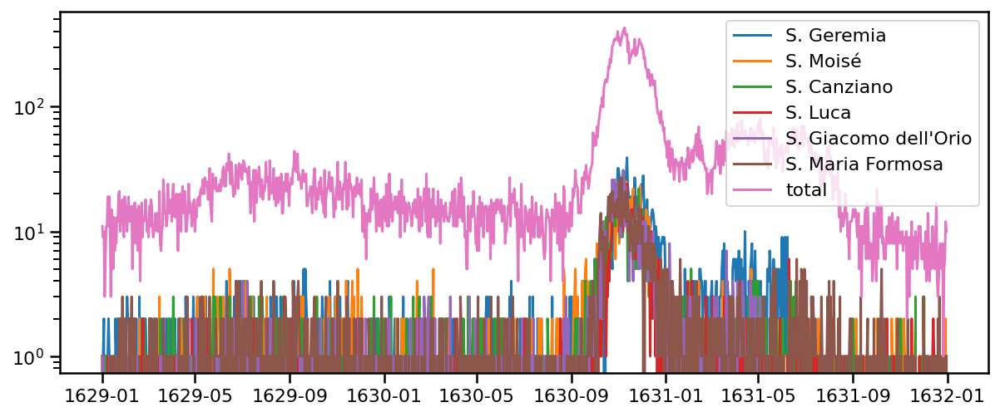

In [140]:
full_df[closest_cluster].plot(figsize=(10,4));

full_df.sum(axis=1).plot(label='total')
# we set yscale to log as the total has much more cases
plt.yscale('log')

plt.legend();

#### bragora cluster

In [141]:
bragora_cluster = [
    'S. Giovanni Battista in Bragora', 'S. Zulian', 'S. Ziminian',
    'S. Giovanni Novo', 'S. Severo'
]

full_df[bragora_cluster].sum().sort_values()

S. Severo                          239.0
S. Ziminian                        499.0
S. Giovanni Novo                   594.0
S. Zulian                          851.0
S. Giovanni Battista in Bragora    957.0
dtype: float64

...less cases in this cluster...

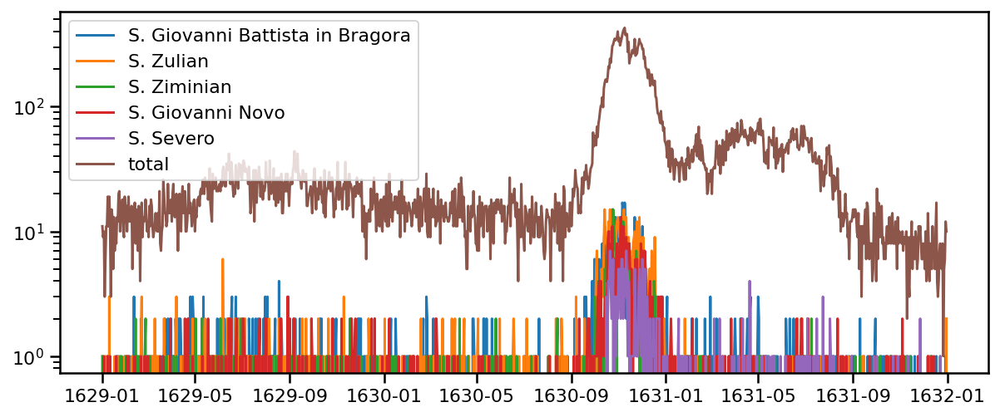

In [143]:
full_df[bragora_cluster].plot(figsize=(10, 4))

full_df.sum(axis=1).plot(label='total')
# we set yscale to log as the total has much more cases
plt.yscale('log')

plt.legend();

... in this cluster we observer __almost no 2nd peak__

#### apostoli cluster

In [160]:
apostoli_cluster = [
    'S. Simon Grande', 'S. Samuele', 'S. Apostoli', 'S. Barnaba'
]

full_df[apostoli_cluster].sum().sort_values()

S. Samuele          725
S. Barnaba          762
S. Simon Grande     969
S. Apostoli        1268
dtype: int64

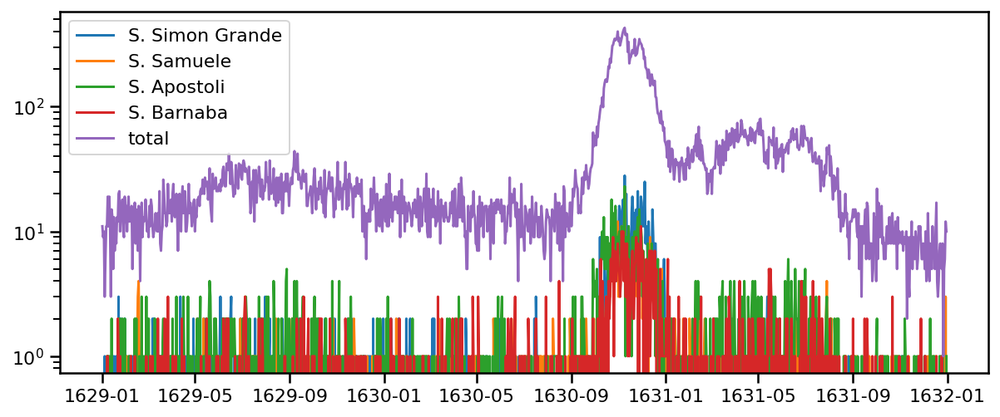

In [147]:
full_df[apostoli_cluster].plot(figsize=(10, 4))

full_df.sum(axis=1).plot(label='total')
# we set yscale to log as the total has much more cases
plt.yscale('log')

plt.legend();

#### nicola cluster

In [150]:
nicola_cluster = [
'Angelo Rafael',    
# 'S. Angelo Rafael',
'S. Nicola',
'S. Eufemia',
'S. Aponal'
]

full_df[nicola_cluster].sum().sort_values()

S. Aponal         959.0
Angelo Rafael    1894.0
S. Eufemia       2089.0
S. Nicola        2097.0
dtype: float64

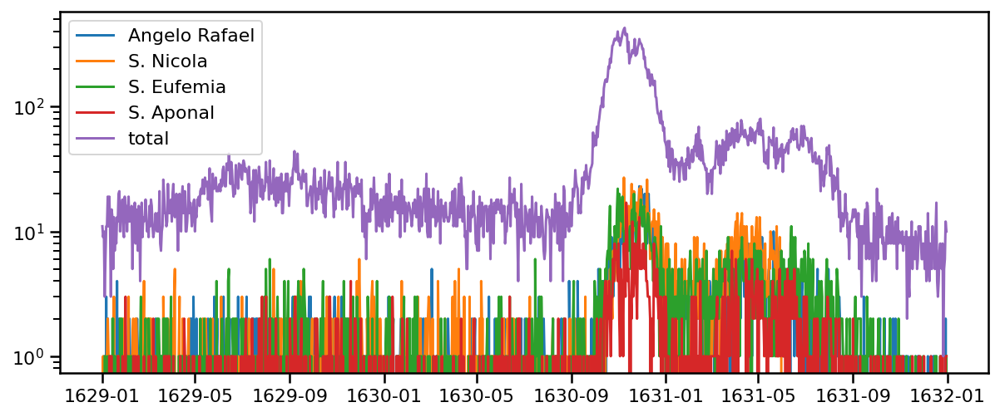

In [151]:
full_df[nicola_cluster].plot(figsize=(10, 4))

full_df.sum(axis=1).plot(label='total')
# we set yscale to log as the total has much more cases
plt.yscale('log')

plt.legend();

_earlier_ 2nd peak 

* Angelo Raf. ~ April / May 

* Nicola ~ April   

* Eufemia ~ June

#### marcuola cluster

In [154]:
marcuola_cluster = [
'S. Sofia',
'S. Marcuola',
'S. Trovaso',
'S. Angelo',
'S. Maria Nova'
]

full_df[marcuola_cluster].sum().sort_values()

S. Maria Nova     385.0
S. Angelo         721.0
S. Trovaso        763.0
S. Sofia          989.0
S. Marcuola      2491.0
dtype: float64

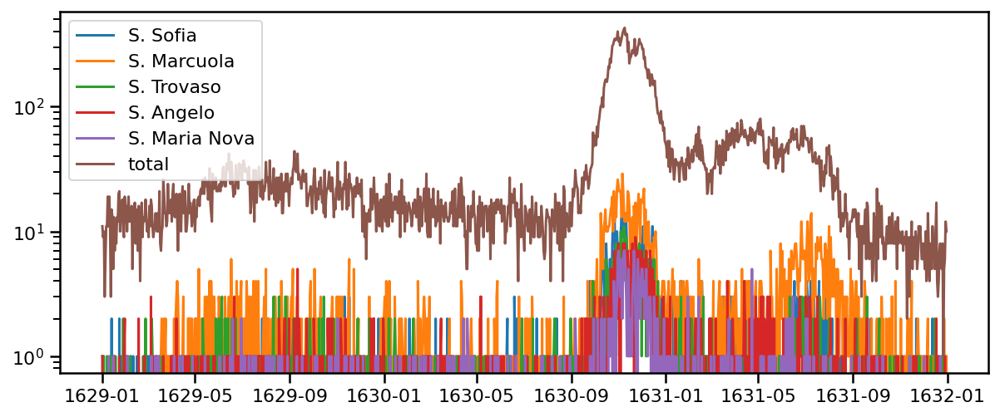

In [156]:
full_df[marcuola_cluster].plot(figsize=(10, 4))

full_df.sum(axis=1).plot(label='total')
# we set yscale to log as the total has much more cases
plt.yscale('log')

plt.legend();

_later_ 2nd peak 

* Marcuola ~  July / August

* the other parish have little N cases...

#### silvestro cluster

In [157]:
silvestro_cluster = [
    'S. Tomà', 'S. Silvestro', 'S. Stin', 'S. Fosca', 'S. Bartolomeo'
]

full_df[silvestro_cluster].sum().sort_values()

S. Fosca         233.0
S. Tomà          337.0
S. Stin          392.0
S. Bartolomeo    411.0
S. Silvestro     727.0
dtype: float64

...this is a cluster with little cases...--> not so important...

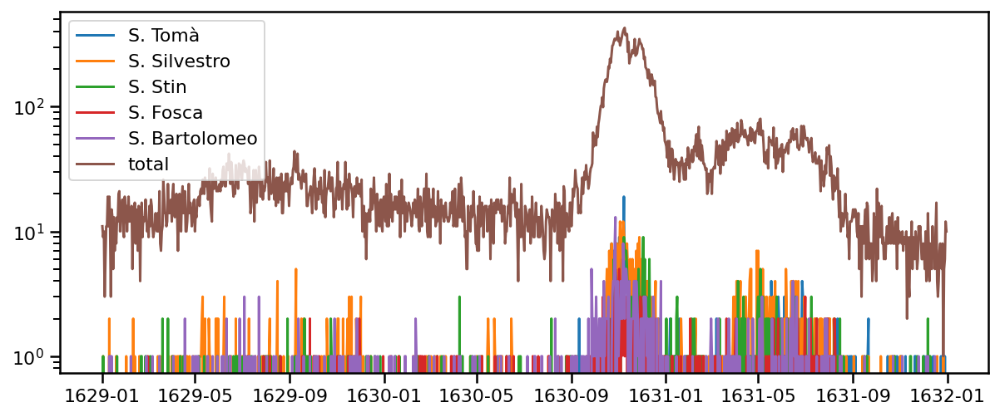

In [159]:
full_df[silvestro_cluster].plot(figsize=(10, 4))

full_df.sum(axis=1).plot(label='total')
# we set yscale to log as the total has much more cases
plt.yscale('log')

plt.legend();

#### croce cluster

this cluster is further from the other (it is a separate 'large cluster')

In [161]:
croce_cluster = [
     
'S. Margherita',
'S. Croce',
'S. Mattio',
'S. Pantalon',
'S. Leonardo',
'S. Agostin',
'S. Maria Maddalena'
]

full_df[croce_cluster].sum().sort_values()

S. Agostin             147.0
S. Leonardo            230.0
S. Maria Maddalena     241.0
S. Mattio              288.0
S. Pantalon            766.0
S. Margherita          799.0
S. Croce              1184.0
dtype: float64

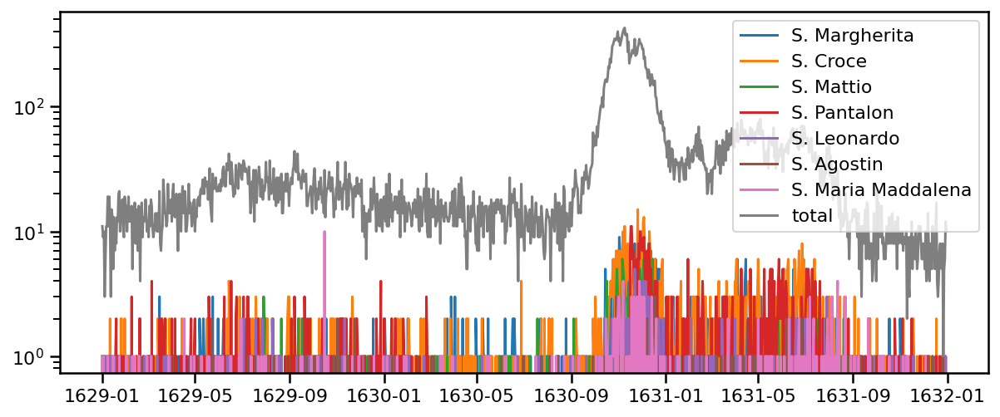

In [162]:
full_df[croce_cluster].plot(figsize=(10, 4))

full_df.sum(axis=1).plot(label='total')
# we set yscale to log as the total has much more cases
plt.yscale('log')

plt.legend();

_middle_ 2nd peak ~ May/ June

## all parishes, 1st peak only

define start and end of first (main) peak

In [163]:
start_1st_peak = datetime.date(1630,9,1)
valley_date = datetime.date(1631,2,1)

first_peak_only_df = full_df.loc[(full_df.index >= start_1st_peak)
                                 & (full_df.index < valley_date)]
first_peak_only_df.shape

mind that there are few parishes with no deaths reported in that time window --> we therefore remove them

In [165]:
new_par_sums = first_peak_only_df.sum()
print(new_par_sums[new_par_sums == 0])

first_peak_only_df = first_peak_only_df[new_par_sums[new_par_sums > 0].keys()]

# double check
print('N parishes with no deaths:', sum(first_peak_only_df.sum() == 0))
first_peak_only_df.shape

S. Marcilian    0.0
S. Polo         0.0
dtype: float64
N parishes with no deaths: 0


(153, 52)

`clustermap` version

In [167]:
sns.set(font_scale=1.2)
sns.clustermap(first_peak_only_df.transpose(),
               col_cluster=False,
               method=my_method,metric=my_metric,
               figsize=(15, 15),
               cbar_kws={'label': 'N cases'},
               xticklabels=20);

plt.savefig('clustering_plots/first_peak_all_par/clustermap_first_peak_all_par.pdf',
            bbox_inches='tight')
plt.close();

##  all parishes and tail

datetime.date(1631,2,1) could be a reasonable date for the end of the 1st peak --> see http://localhost:8888/view/explorative_plots/all_by_parish.html

In [172]:
valley_date = datetime.date(1631, 2, 1)
# tail_df = full_df.loc[full_df.index >= valley_date,
#                       sum_by_par[sum_by_par > 500].keys()]

## ALL parishes, in the tail, with NON zero values
tail_df = full_df.loc[full_df.index >= valley_date]
tail_df = tail_df.loc[:, tail_df.sum() > 0]

tail_df.shape

(334, 52)

overview of largest parishes in tail

In [173]:
tail_df.sum(axis=0).sort_values(ascending=False)[:10]

S. Eufemia               794.0
S. Marcuola              785.0
S. Pietro di Castello    727.0
Angelo Rafael            665.0
S. Nicola                641.0
S. Croce                 448.0
S. Geremia               438.0
S. Aponal                346.0
S. Maria Formosa         338.0
S. Pantalon              309.0
dtype: float64

### computation

`dendrogram` version

In [176]:
clus_matrix = linkage(y=tail_df.transpose(),
                      method=my_method,
                      metric=my_metric,
                      optimal_ordering=True)

plt.figure(figsize=(15, 15),frameon=False)

dendrogram(clus_matrix,
##            tree truncation parameters
#            truncate_mode='level',p=1,show_contracted=True,
##            sorting makes clusters more clear -- we checked that it gives the same result
           distance_sort=True,
           leaf_font_size=14,
           labels=tail_df.columns,
           orientation='left')

plt.tight_layout();

# plt.savefig('clustering_plots/tail_clustering/tail_clustering.pdf')
plt.savefig('clustering_plots/tail_clustering/all_tail_clustering.pdf')
plt.close();

`clustermap` version

In [177]:
sns.set(font_scale=1.2)

sns.clustermap(tail_df.transpose(),
               col_cluster=False,
               method=my_method,
               metric=my_metric,
               figsize=(15, 15),
               cbar_kws={'label': 'N cases'},
               xticklabels=100)

# plt.savefig('clustering_plots/tail_clustering/clustermap_tail_clustering.pdf',
#            bbox_inches='tight')
plt.savefig(
    'clustering_plots/tail_clustering/clustermap_ALL_tail_clustering.pdf',
    bbox_inches='tight')

plt.close()

### comments

more interesting / clear separation...

there seems to be _2 main clusters_ :

* _Marcuola/Eufemia cluster_ :

    S. Trovaso S. Barnaba S. Croce
    S. Marcuola S. Sofia
    S. Maria Formosa S. Margherita
    S. Eufemia
    S. Silvestro
    S. Pantalon

    which seem to have a clearly shifted 2nd peak ~June/July


* _Geremia/Angelo Rafael/ Nicola cluster_ :

    S. Geremia
    S. Nicola
    S. Angelo Rafael
    S. Basilio
    S. Giacomo dell'Orio 
    S. Pietro di Castello 

    which seem to have a _earlier_ 2nd peak ~ March - May

# Distance correlation

## computation

In [11]:
# module to compute geo distance 
from geopy.distance import geodesic

# module to get combination of states
from itertools import combinations

function to compute correlations between parishes

In [17]:
def space_corr_fun(signal_data, selected_traces, geo_data):
    '''
    function to compute correlation coefficients for each pair of parish
    
    Parameters
    -----------
    signal_data : (preprocessed) signals dataframe
    selected_traces : COLUMNS of the signal dataframe (parish, cities,...)
    geo_data : location dataset used to compute distance among all pairs of state/county, etc...

    Returns
    -----------
    Dataframe with distances and parwise correlations 
    
    '''

    df_to_return = pd.DataFrame(columns=['dist', 'corr_signal'])

    for parish_1, parish_2 in combinations(selected_traces, 2):

        my_pair = parish_1 + '_' + parish_2

        #compute & store distances in meters -- as we are within Venice
        df_to_return.loc[my_pair, 'dist'] = geodesic(geo_data.loc[parish_1, ], geo_data.loc[parish_2, ]).km * 1000

        #compute & store correlations
        df_to_return.loc[my_pair, 'corr_signal'] = round(np.corrcoef(signal_data[parish_1], signal_data[parish_2])[1, 0], 
                                                         4)
        # ...and sort by distance
        df_to_return.sort_values(by='dist', inplace=True)

    return df_to_return

load `geo_df`  – mind that this dataset is computed below in the [#compute-parish-centroids](#compute-parish-centroids) section

In [16]:
geo_df = pd.read_csv('dataset/geo_df.csv',index_col=0)
geo_df.head()

,lat,long
S. Agnese,45.430530,12.327675
S. Agostin,45.438717,12.328540
S. Angelo,45.434629,12.331982
Angelo Rafael,45.432030,12.318256
S. Antonino,45.435758,12.346070


for ALL parish, on WHOLE time window

In [18]:
corr_df = space_corr_fun(full_df, full_df.columns, geo_df)

print(corr_df.shape)
corr_df.head()

(1431, 2)


,dist,corr_signal
S. Maurizio_S. Vidal,69.6359,0.243
S. Luca_S. Paternian,80.706,0.7174
S. Aponal_S. Silvestro,81.9741,0.5451
S. Basso_S. Zulian,89.4042,0.3849
S. Lio_S. Marina,94.5735,0.5047


 only for parish with > `size_thres`  cases, on WHOLE time window

In [27]:
## same threshold used in clustering
size_thres = 500
corr_df = space_corr_fun(full_df, sum_by_par[sum_by_par > size_thres].keys(),
                         geo_df)

print(corr_df.shape)
corr_df.head()

(378, 2)


,dist,corr_signal
S. Aponal_S. Silvestro,81.9741,0.5451
S. Canziano_S. Apostoli,146.587,0.6908
S. Giovanni Novo_S. Maria Formosa,152.792,0.7508
S. Barnaba_S. Trovaso,156.815,0.5665
S. Giacomo dell'Orio_S. Simon Grande,161.666,0.7016


for parish with > `size_thres` cases, on tail only

In [30]:
## same size threshold used in clustering
size_thres = 500
valley_date = datetime.date(1631, 2, 1)
corr_df = space_corr_fun(full_df.loc[full_df.index >= valley_date],
                         sum_by_par[sum_by_par > size_thres].keys(), geo_df)

print(corr_df.shape)
corr_df.head()

(378, 2)


,dist,corr_signal
S. Aponal_S. Silvestro,81.9741,0.2538
S. Canziano_S. Apostoli,146.587,0.2831
S. Giovanni Novo_S. Maria Formosa,152.792,0.0147
S. Barnaba_S. Trovaso,156.815,0.1698
S. Giacomo dell'Orio_S. Simon Grande,161.666,0.082


__convert__ to numeric

In [28]:
corr_df.dist = corr_df.dist.apply(lambda x: np.float(x))
corr_df.corr_signal = corr_df.corr_signal.apply(lambda x: np.float(x))

## interactive plot 

setting `plotly` layout

In [25]:
dist_corr_layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     ),
    xaxis=dict(
#         type='log',
        autorange=True,
        title='distance (m)',
        titlefont=dict(
            size=18
        )
    ),
    yaxis=dict(
#         type='log',
        autorange=True,
        title='pearson correlation',
        titlefont=dict(
            size=18
        )
    )
)

loop to build traces to plot

In [23]:
total_trace = []

for my_col in corr_df.columns.difference(['dist']):

    data_trace = go.Scatter(x=corr_df.dist,
                            y=corr_df[my_col],
                            mode='markers',
                            name=my_col,
                            text=list(corr_df.index))

    total_trace.append(data_trace)

In [26]:
fig = go.Figure(data=total_trace, layout=dist_corr_layout)

# simple binomial forumula :), reverse of --> n(n-1)/2 = L
n_trace_plotted = int((1 + np.sqrt(8*corr_df.shape[0]+1))/2)
 
py.plot(fig,
        filename='./explorative_plots/preselected_{}_parishes_distance_corre.html'.format(n_trace_plotted))
#         filename='./explorative_plots/preselected_{}_parishes_distance_corre_2nd_peak.html'.format(n_trace_plotted))

'./explorative_plots/preselected_54_parishes_distance_corre.html'

## static plot 

largest_28_parishes_distance_corre_2nd_peak


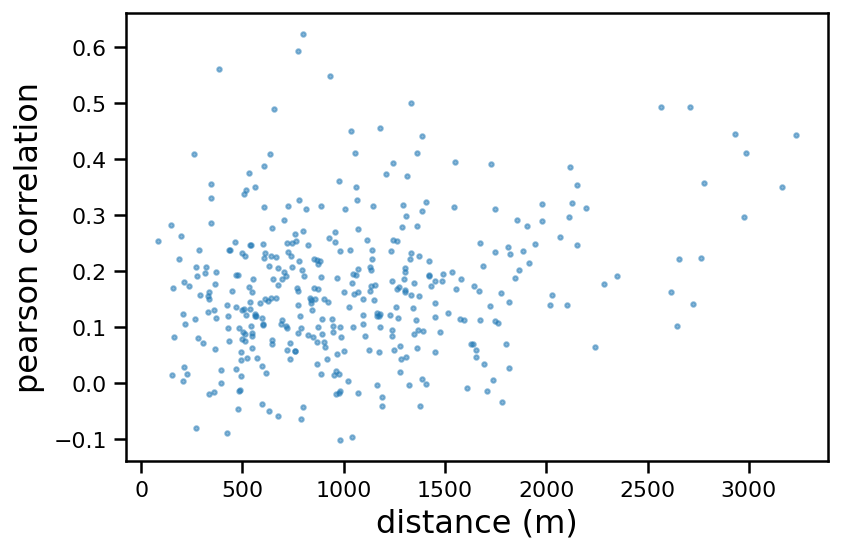

In [31]:
corr_df.plot.scatter('dist', 'corr_signal', s=5, alpha=0.5)

plt.xlabel('distance (m)', size=16)
plt.ylabel('pearson correlation', size=16)

plt.tight_layout()

# simple binomial forumula :), reverse of --> n(n-1)/2 = L
n_trace_plotted = int((1 + np.sqrt(8 * corr_df.shape[0] + 1)) / 2) 

filename = 'largest_{}_parishes_distance_corre_2nd_peak'.format(n_trace_plotted)
# filename = 'largest_{}_parishes_distance_corre_full_ts'.format(n_trace_plotted)
print(filename)

plt.savefig('./explorative_plots/' + filename + '.pdf')

# Extra: Time map

this section is **not part of the paper** – we still wanted to share it, in case someone is motivated to finish it up...

...mind that this is also **where `geo_df.csv` is computed**

these are good example of what we have in mind:

[folium TimeSliderChoropleth](https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/TimeSliderChoropleth.ipynb)

- see
[this tutorial](http://comet.lehman.cuny.edu/owen/teaching/datasci/choroplethLab.html) 
and
[this doc](https://python-visualization.github.io/folium/docs-v0.6.0/quickstart.html#GeoJSON/TopoJSON-Overlays)
for the geoJson integration

- [how to get cloropleth with plotly](https://plot.ly/python/choropleth-maps/)

##  basic map

In [34]:
import folium

In [35]:
##  basic map -- best tiles among: 'CartoDB positron', 'Stamen Terrain'
cases_time_map = folium.Map(location=[45.43, 12.34],zoom_start=14,tiles='Stamen Terrain')

cases_time_map.save('explorative_plots/cases_time_map.html')

## merge parish names 

In [48]:
geojson_layer = folium.GeoJson('./DataGIS/1729_PAR_CONF.zip.geojson',
                               name='parish')

show `geojson` data

In [38]:
print(geojson_layer.data.keys())
print(geojson_layer.data['type'])
# print(geojson_layer.data['crs'])
print(len(geojson_layer.data['features']))

print('example of data structure for the first parish:')
print(geojson_layer.data['features'][0].keys())
print(geojson_layer.data['features'][0]['type'])
# geojson_layer.data['features'][0]['geometry'] # this is just the polygon
print(geojson_layer.data['features'][0]['properties'])

dict_keys(['type', 'bbox', 'features'])
FeatureCollection
86


In [40]:
# extract parish names  in geojson -- mind NaNs
parish_geojson =  [my_p['properties']['NAME'] for my_p in geojson_layer.data['features'] \
                   if my_p['properties']['NAME']!=None]

# list NaNs
[my_p['properties']['NAME'] for my_p in geojson_layer.data['features'] \
                   if my_p['properties']['NAME']==None]

[]

check perfect overlap 

In [41]:
# check differences
[print(my_p) for my_p in full_df.columns if my_p not in parish_geojson]

Angelo Rafael


[None]

In [12]:
# ...therefore we don't need to keep 2 copies 

del parish_geojson
gc.collect()

7

In [34]:
### ### ### depending on the dataset, we might NOT need this preprocessing ### ### ### 

# import re

# #  remove the prefix to reduce overlapping issues
# fixed_parish_geojson = [
#     re.sub('Sant\'|Santa |Santi |San ', '', my_p) for my_p in parish_geojson
# ]
# print(len(fixed_parish_geojson))

# #  remove the prefix to reduce overlapping issues
# fixed_full_df_columns = [
#     re.sub('S. ', '', my_p) for my_p in full_df.columns
# ]

# print(len(fixed_full_df_columns))

# print(' / '.join(fixed_full_df_columns))

# print(' / '.join(fixed_parish_geojson))

##  compute parish centroids

In [42]:
# define empty df to store parish/centroid position
geo_df = pd.DataFrame(columns=['lat','long'],index=full_df.columns)

# compute centroids 

for my_p in geojson_layer.data['features']:
    
    # check if not a NaN and if contained in cases dataset     
    if (my_p['properties']['NAME']!=None) & (my_p['properties']['NAME'] in full_df.columns) :
        
        my_p_name = my_p['properties']['NAME']
        
        #compute centroids
        geo_df.lat[my_p_name] = np.mean([lat_p[1] for lat_p in  my_p['geometry']['coordinates'][0] ])
        geo_df.long[my_p_name] = np.mean([lat_p[0] for lat_p in  my_p['geometry']['coordinates'][0] ])

#         fix data type
geo_df.lat = geo_df.lat.astype(np.float64)
geo_df.long = geo_df.long.astype(np.float64)

# save geo dataframe 
geo_df.to_csv('dataset/geo_df.csv')

print(geo_df.shape)
geo_df.head()

(54, 2)


,lat,long
S. Agostin,45.438717,12.328540
S. Angelo,45.434629,12.331982
Angelo Rafael,NaN,NaN
S. Antonino,45.435758,12.346070
S. Aponal,45.437659,12.331960


## parish markers layer

In [43]:
from folium.plugins import MarkerCluster

In [192]:
# ##  basic map -- best tiles among: 'CartoDB positron', 'Stamen Terrain'
# cases_time_map = folium.Map(location=[45.44, 12.34],zoom_start=14,tiles='Stamen Terrain')

 this layer-based approach was based on [this blog post](https://ocefpaf.github.io/python4oceanographers/blog/2015/12/14/geopandas_folium/)

mind that the markers have to be insert __before__ the polygon later -- otherwise are not show 

In [ ]:
my_markers = folium.FeatureGroup(name='parish names')
my_markers.add_child(MarkerCluster(locations=geo_df.values.tolist()))
#                                    popups=geo_df.index))
# cases_time_map.add_child(my_markers)

my_markers.add_to(cases_time_map);


cases_time_map.save('explorative_plots/cases_time_map.html')

maybe [this GH issue](https://github.com/python-visualization/folium/issues/809) can help??


In [165]:
# ## this code works, until one puts the tooltip or popus! 

# geo_df.apply(
#     axis=1,
#     func=lambda x: markers.add_child(folium.Marker(location=[x.lat, x.long],)))
# #                                  tooltip=x.name).\

# # add layer to main map
# cases_time_map.add_child(markers)

## polygons layer

In [46]:
## add parish polygons
geojson_layer.add_to(cases_time_map);

cases_time_map.save('explorative_plots/cases_time_map.html')

In [47]:
# add layer control for all future layers
cases_time_map.add_child(folium.LayerControl());

we should reduce/eliminate the internal coloring of polygons ...

## add cases data

there is also [this example on CO2](https://geohackweek.github.io/ghw2018_web_portal_inlandwater_co2/InteractiveTimeSeries.html)

In [205]:
from folium.plugins import TimeSliderChoropleth

build the `styledict` for `TimeSliderChoropleth`

In [76]:
# cases_styledict = full_df.transpose().to_dict()

In [206]:

# cases_time_map.add_child(TimeSliderChoropleth(geojson_layer,cases_styledict,
#                                               name='cases'))

# Extra: cross/auto correlations 

## CCF

we need different built-in function from `scipy.signal`

In [57]:
from scipy.signal import find_peaks_cwt

select parishes with __complete data__

In [51]:
### mind that we have filled all NaNs with 0 
good_parishes = list(full_df.notnull().sum()[full_df.notnull().sum()==full_df.shape[0]].keys())
print('N. parishes with complete data = ', len(good_parishes))

N. parishes with complete data =  54


__example__ of cross-correlation between 2 parishes time-series

plot of selected time series

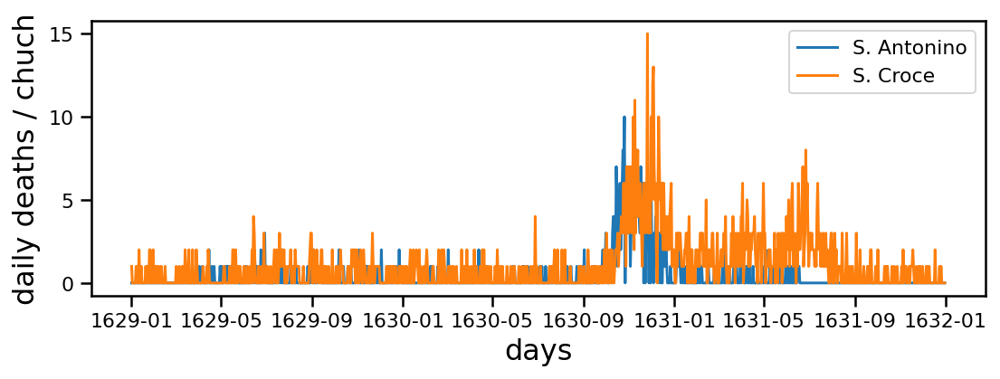

In [60]:
par_1 = good_parishes[11]
par_2 = good_parishes[3]

plt.figure(figsize=(8,3))
plt.plot(full_df.loc[:, par_2], label=str(par_2))
plt.plot(full_df.loc[:, par_1], label=str(par_1))

plt.ylabel('daily deaths / chuch', size=16)
plt.xlabel('days', size=16)
plt.legend()
plt.tight_layout();

plot time cross-correlation

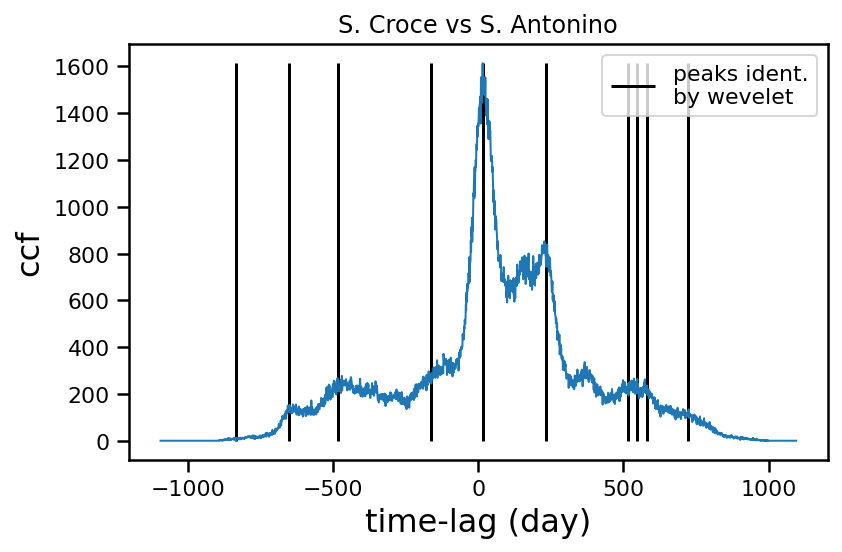

In [74]:
# define the time-lag axis
my_lag = np.linspace(start=-full_df.shape[0],
                     stop=full_df.shape[0],
                     num=2 * full_df.shape[0] - 1)

# compute and plot the ccf
par1_par2_ccf = np.correlate(full_df.loc[:, par_1],
                             full_df.loc[:, par_2],
                             mode='full')
plt.plot(my_lag, par1_par2_ccf, linewidth=1)

# find and plot peaks of ccf
ccf_peaks = find_peaks_cwt(par1_par2_ccf, np.arange(20, 50, 5))
plt.vlines(x=ccf_peaks - full_df.shape[0],
           ymin=min(par1_par2_ccf),
           ymax=max(par1_par2_ccf),
           color='k',
           label='peaks ident.\nby wevelet')

plt.xlabel('time-lag (day)', size=16)
plt.ylabel('ccf', size=16)
plt.title(str(par_1) + ' vs ' + str(par_2))
plt.legend()
plt.tight_layout()

compute and plot ccf for __each VS total__

In [80]:
total_deaths = full_df.sum(axis=1)

In [81]:
# create df to store ccf for all parishes
par_tot_ccf = pd.DataFrame()

for p in good_parishes:

    par_tot_ccf[p] = np.correlate(full_df.loc[:, p], total_deaths, mode='full')

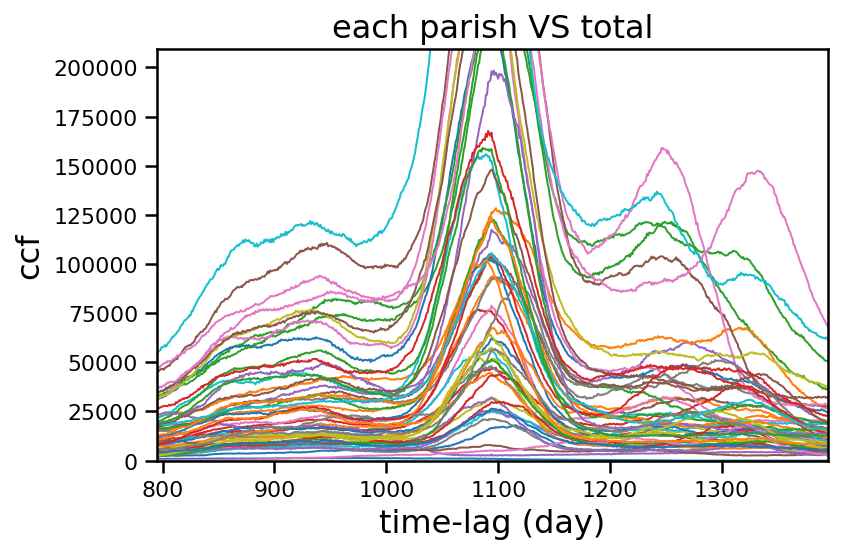

In [89]:
par_tot_ccf.plot(legend=None, linewidth=1)

plt.ylim([0, par_tot_ccf.max().max() / 2])
plt.xlim([full_df.shape[0] - 300,
          full_df.shape[0] + 300])  # zooming the x-axis

plt.title('each parish VS total', size=16)
plt.xlabel('time-lag (day)', size=16)
plt.ylabel('ccf', size=16)

plt.tight_layout()

compute local maxima of ccf

In [90]:
# make general empty dicts to store thre main ccf peaks, for each parish
ccf_1stmax_pos = {}
ccf_2ndmax_pos = {}
ccf_3rdmax_pos = {}

# make general empty dict
# ccf_peaks_dict = {}

# ccf_max_pos = []

for par in par_tot_ccf.columns:
        
    ## find local maxima
    ccf_peaks = find_peaks_cwt(par_tot_ccf.loc[:,par],np.arange(20,50,5))
    
    ## create a dictionary of maxima - value:position 
    peaks_dict = {par_tot_ccf.loc[p,par]:p for p in ccf_peaks}
    
    ## sort the dict by peak-values and take the first 3
    first_3_peaks = sorted(peaks_dict.keys(),reverse=True)[:3]

    ## get the corresponding position of the 3 main peaks - info not necessary
#     ccf_max_pos.extend([peaks_dict[p] for p in first_3_peaks]) 

    ## store it 
    ccf_1stmax_pos[par] = peaks_dict[first_3_peaks[0]]
    ccf_2ndmax_pos[par] = peaks_dict[first_3_peaks[1]]
    ccf_3rdmax_pos[par] = peaks_dict[first_3_peaks[2]]
    
#     ccf_max_pos.extend(ccf_peaks)

plot distribution of  3 largest peaks

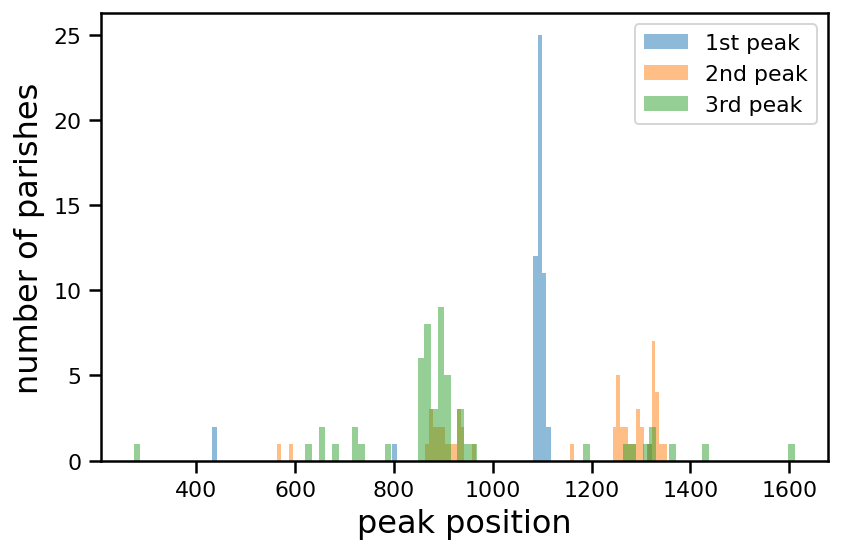

In [92]:
plt.hist(ccf_1stmax_pos.values(), label='1st peak', bins=100, alpha=0.5)
plt.hist(ccf_2ndmax_pos.values(), label='2nd peak', bins=100, alpha=0.5)
plt.hist(ccf_3rdmax_pos.values(), label='3rd peak', bins=100, alpha=0.5)

plt.legend()
plt.xlabel('peak position', size=16)
plt.ylabel('number of parishes', size=16)

plt.tight_layout()

###  parish with outlier ccf peaks

In [93]:
def outlier_plot(my_outlier):
    
    f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
    #to increase plot size --> figsize=(10,5))

    # plot ccf
    ax1.plot(par_tot_ccf[my_outlier],label=my_outlier)
    ax1.set_ylabel('ccf',size=16)
    ax1.set_xlabel('time-lag (day)',size=16)

    # plot ts
    ax2.plot(full_df[my_outlier],label=my_outlier)
    ax2.plot(total_deaths/(full_df.shape[1]-1),label='mean')
    ax2.set_ylabel('daily deaths',size=16)
    ax2.set_xlabel('days',size=16)
    ax2.legend();

    plt.tight_layout()

#### 1st ccf peak 

__S Marco__ seems to be quite an outlier - indeed:

In [94]:
# print parishies with 1st peak furher than X=100 days from 0 
[print(k,v) for k,v in ccf_1stmax_pos.items() if abs(v - full_df.shape[0]) > 100];

S. Marcilian 803
S. Marco 432
S. Polo 438
S. Stae 1322


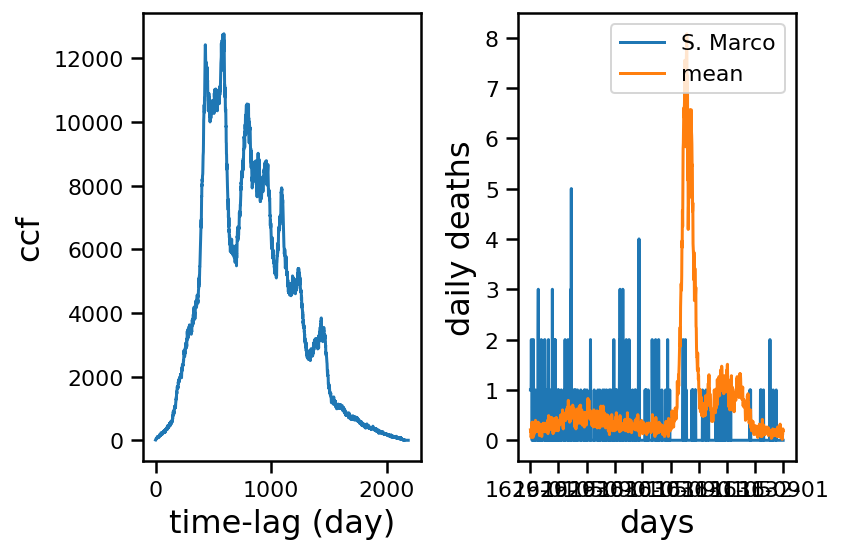

In [95]:
outlier_plot('S. Marco')

...however, S Marco is not an important parish, in term of N deaths:

In [96]:
full_df['S. Marco'].sum()

203

#### 2nd ccf peak 

In [97]:
# print parishies with 2nd peak furher than X=300 days from 0 
[print(k,v) for k,v in ccf_2ndmax_pos.items() if abs(v - full_df.shape[0]) > 300];

S. Marco 588
S. Polo 564


#### 3rd ccf peak 

In [98]:
# print parishies with 3rd peak furher than X=300 days from 0 
outlier_3rd_peak = [k for k,v in ccf_3rdmax_pos.items() if abs(v - full_df.shape[0]) > 300];

In [99]:
outlier_3rd_peak

['S. Agostin',
 'S. Aponal',
 'S. Biagio',
 'S. Eufemia',
 'S. Giovanni di Rialto',
 'S. Leonardo',
 'S. Marcilian',
 'S. Marco',
 'S. Marina',
 'S. Polo',
 'S. Vidal']

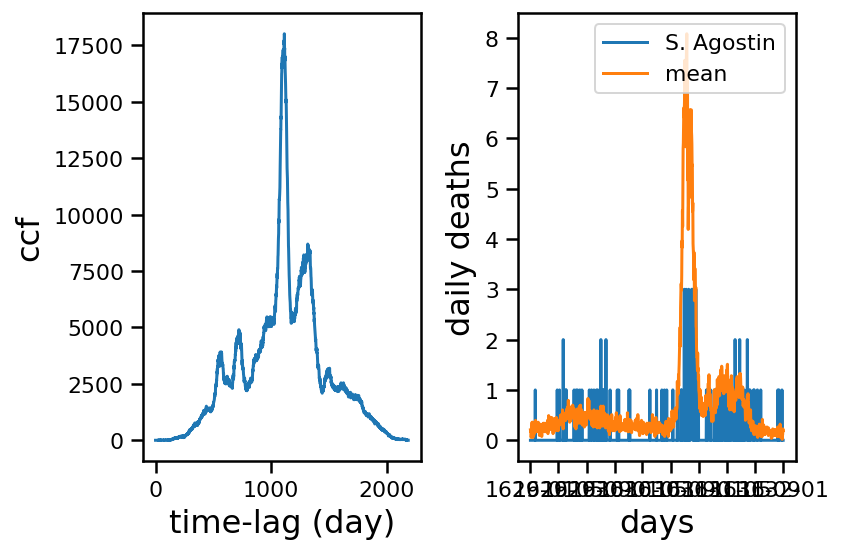

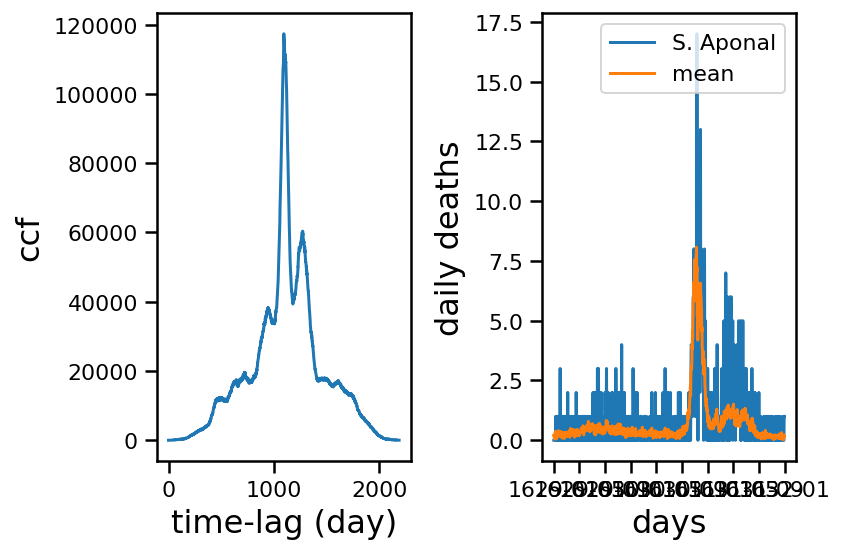

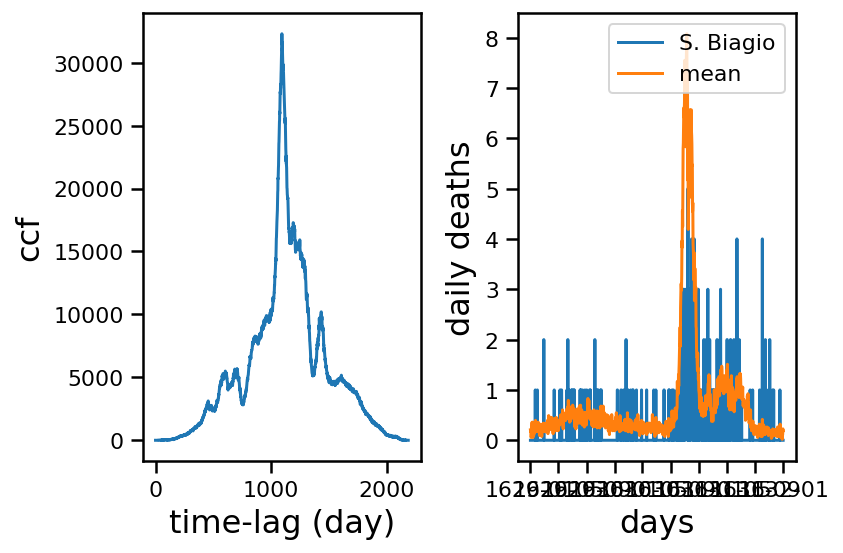

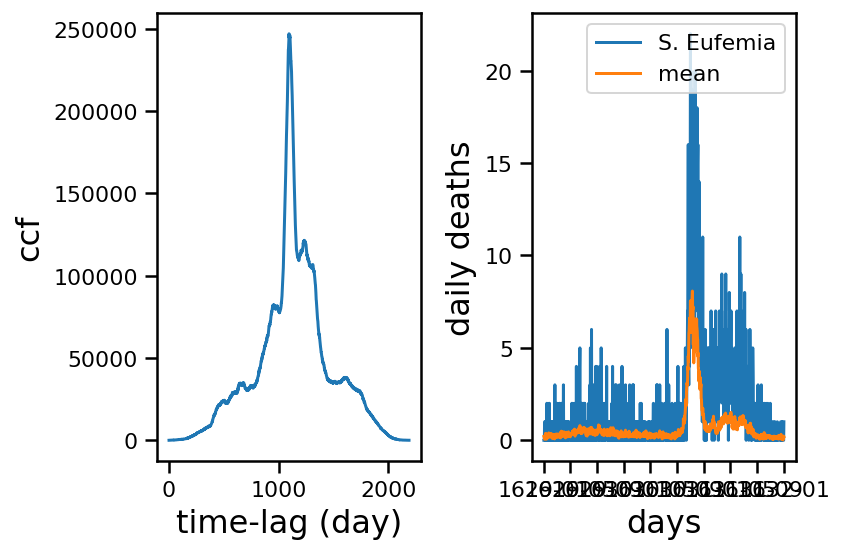

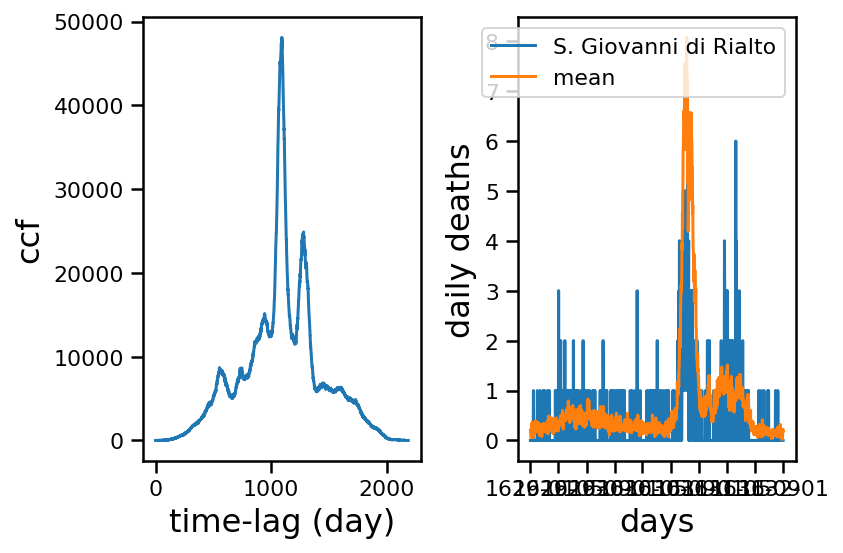

...

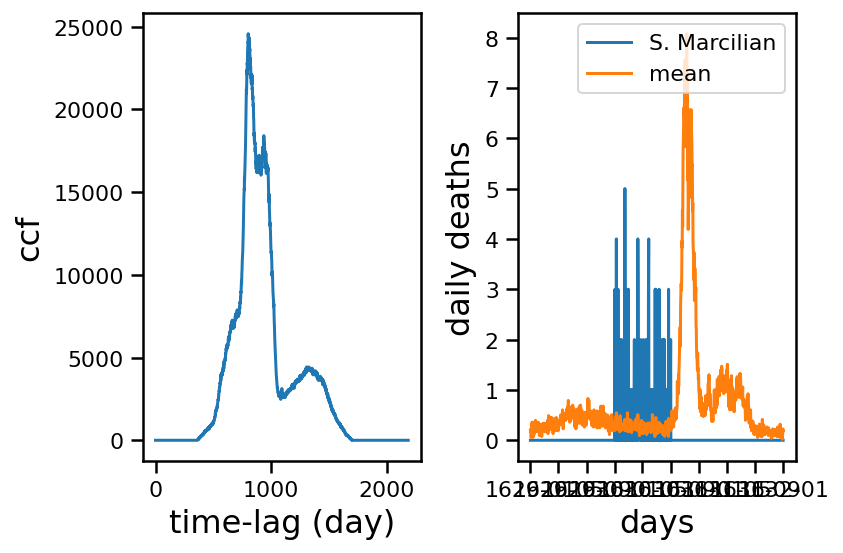

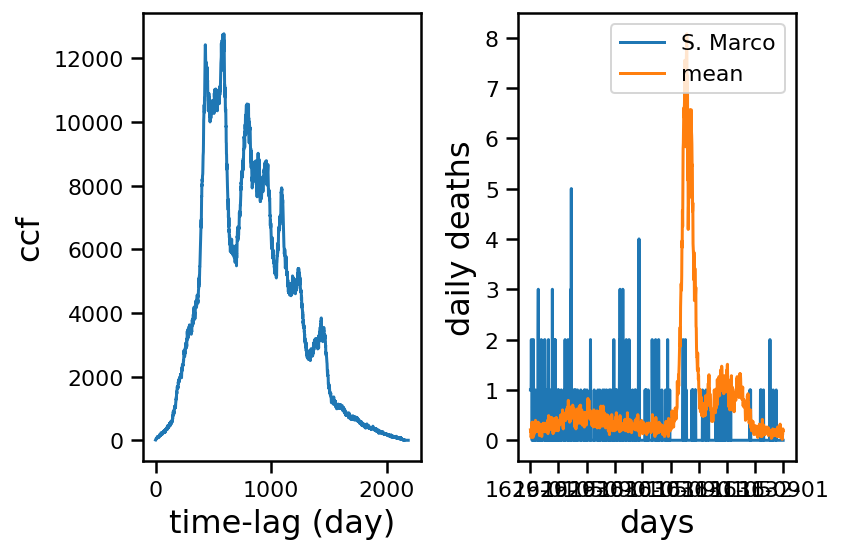

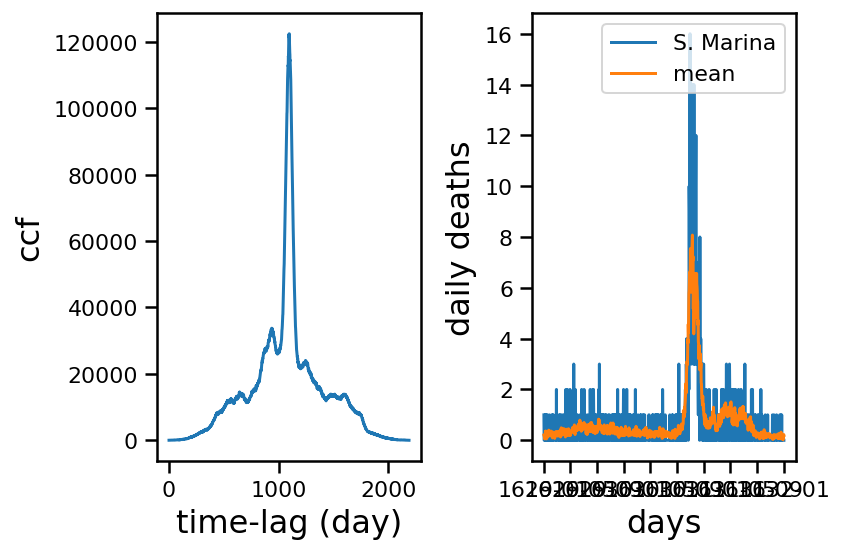

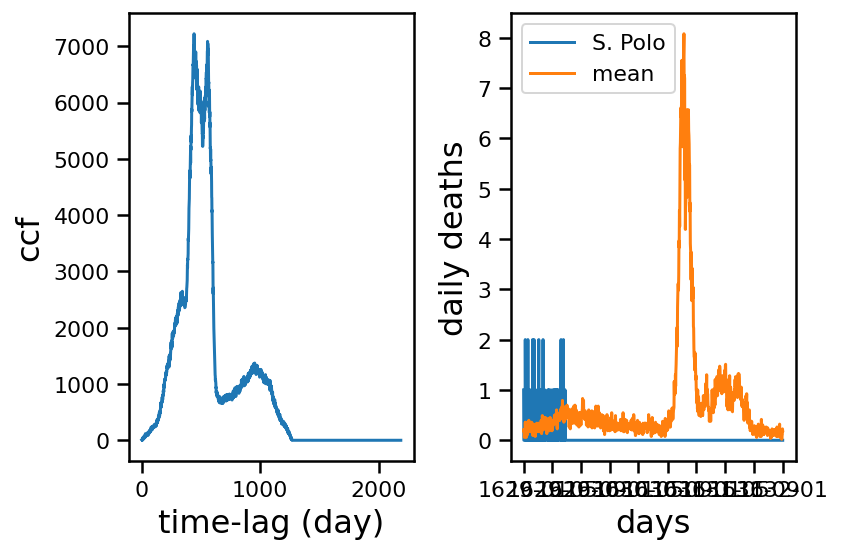

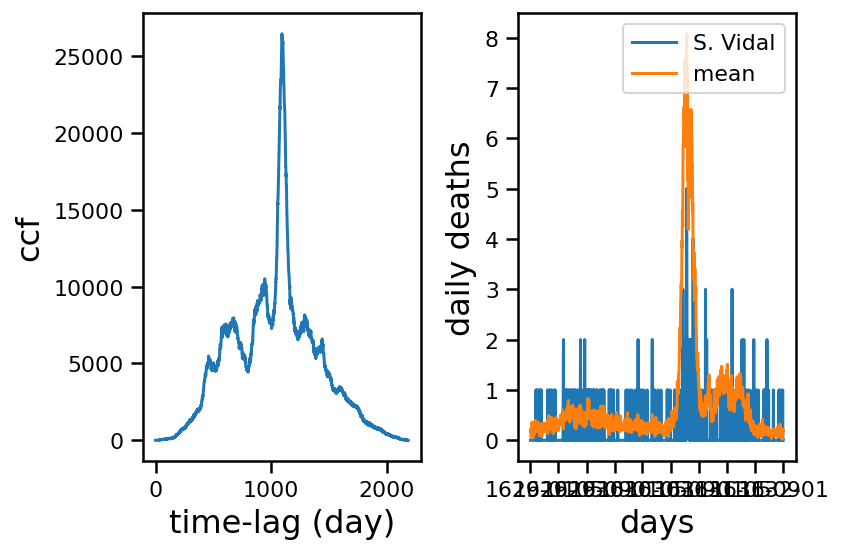

In [100]:
for out in outlier_3rd_peak:
    
    outlier_plot(out)

list parish with highest syn with total

In [101]:
for col in par_tot_ccf.columns:

    # print only parish with large ccf
    if sum(par_tot_ccf[col] > 10**5) > 0:

        print(col)

Angelo Rafael
S. Aponal
S. Barnaba
S. Canziano
S. Croce
S. Eufemia
S. Geremia
S. Giacomo dell'Orio
S. Giovanni Battista in Bragora
S. Giovanni Novo
S. Luca
S. Marcuola
S. Maria Formosa
S. Marina
S. Moisé
S. Nicola
S. Pietro di Castello
S. Samuele
S. Silvestro
S. Simon Grande
S. Sofia
S. Trovaso
S. Ziminian
S. Zulian
S. Apostoli


## ACF

In [104]:
# create df to store ccf for all parishes
par_auto_cf = pd.DataFrame()

for p in good_parishes:

    par_auto_cf[p] = np.correlate(full_df.loc[:, p],
                                  full_df.loc[:, p],
                                  mode='full')
#     par_auto_cf[p] = ccf(full_df.loc[:,p],full_df.loc[:,p])

the 2nd peak of the ACF should correspond at the distance (~best overlap) between the large outbreak and 'tail outbreak'

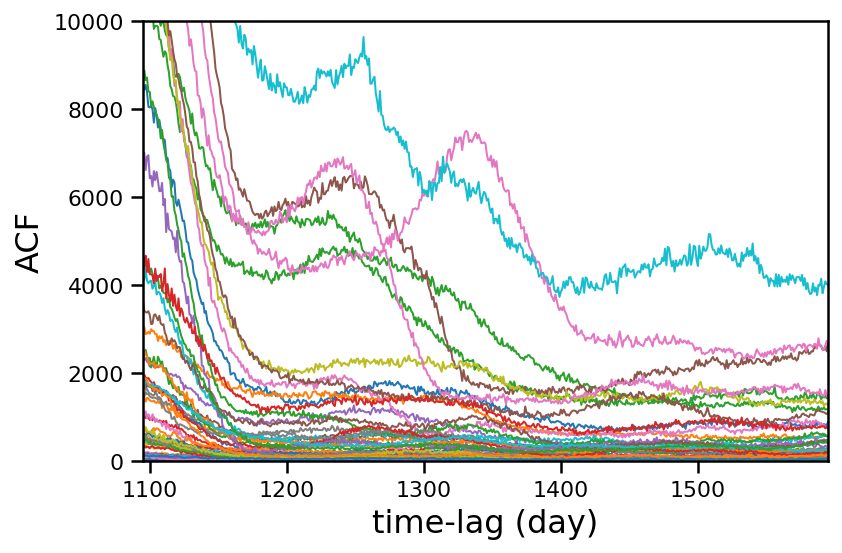

In [105]:
par_auto_cf.plot(legend=None,linewidth=1)

plt.ylim([0,10**4])
plt.xlim([full_df.shape[0],full_df.shape[0]+500])

plt.xlabel('time-lag (day)',size=16)
plt.ylabel('ACF',size=16);

plt.tight_layout()
# plt.savefig('./explorative_plots/acf.pdf')

### check for randomness 

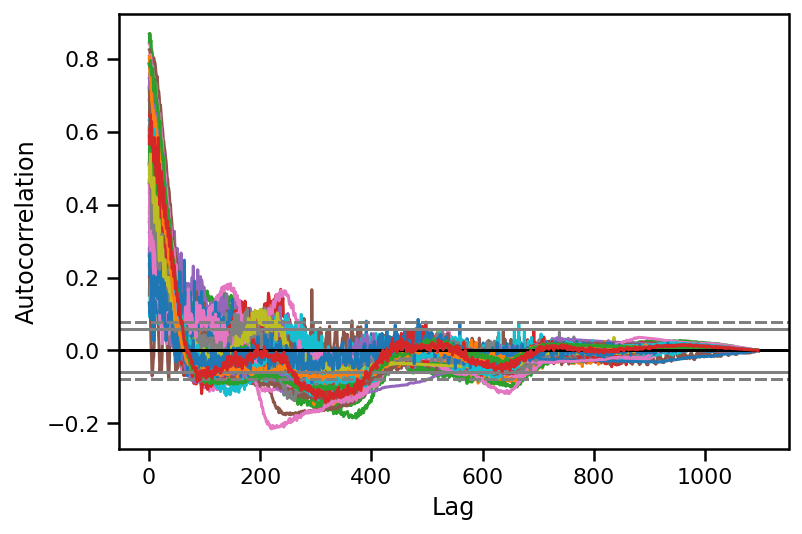

In [110]:
my_ax = plt.gca()
# my_ax.set_xscale('log')
# my_ax.set_yscale('symlog')

for my_parish in full_df.columns:
    
    pd.plotting.autocorrelation_plot(full_df[my_parish],ax=my_ax)

## lag plots

[reasons to plot lag plots](https://www.statisticshowto.datasciencecentral.com/lag-plot/)

<ipython-input-113-9a9e8a56b354>:11: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.



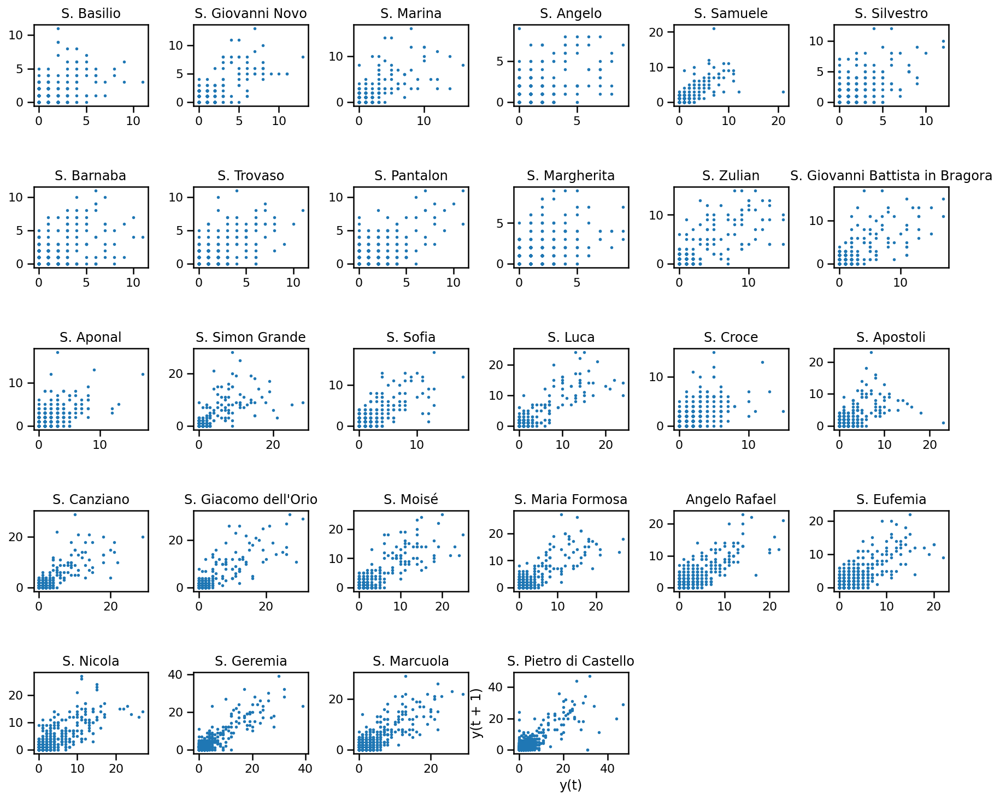

In [113]:
subplt_size = np.ceil(np.sqrt(sum(sum_by_par > 500)))
my_lag = 1

fig = plt.figure(figsize=(15, 15))
i = 0

# mind that the subplots are SORTED by N of cases!
for my_col in sum_by_par[sum_by_par > 500].sort_values().keys():

    i += 1
    my_ax = fig.add_subplot(subplt_size, subplt_size, i)

    pd.plotting.lag_plot(full_df[my_col], lag=my_lag, s=3, ax=my_ax)

    my_ax.set_title(my_col)
    my_ax.set_ylabel('')
    my_ax.set_xlabel('')

plt.subplots_adjust(wspace=0.4, hspace=1)

plt.xlabel('y(t)')
plt.ylabel('y(t + {})'.format(my_lag));

also lag plots confirm strong non-randomness in most of the parish...

linear pattern --> auto-corrlation